In [27]:
import json
import boto3
import botocore
import PIL
import io
import os
from PIL import Image, ImageFont, ImageDraw, ImageEnhance
from io import BytesIO

In [28]:
# aws_region = "us-west-2"

font = ImageFont.truetype("arialbd.ttf", 70)
# font

In [29]:
s3 = boto3.client("s3")
bucket = "mgt-hnjng"
object_key = "mzc_project/test-image/20200715_132121.jpg"
save_path = "mzc_project/save-image"
save_name = "bbox_test2"

source_img = s3.get_object(Bucket=bucket, Key=object_key)["Body"].read()

In [30]:
runtime = boto3.Session().client("sagemaker-runtime")
endpoint = "ObjectDetection-2020-10-27"

In [31]:

# inference_image = Image.open(io.BytesIO(source_img))

response = runtime.invoke_endpoint(
    EndpointName=endpoint, 
    ContentType="application/x-image",
    Body=source_img
)
result = json.loads(response["Body"].read().decode())
print(result)  # Label 번호, 신뢰도, 좌표

{'prediction': [[3.0, 0.966410219669342, 0.36416321992874146, 0.06455457955598831, 0.5224201083183289, 0.312411367893219], [5.0, 0.5842565894126892, 0.4904245436191559, 0.10813134908676147, 0.6789159774780273, 0.9033156037330627], [4.0, 0.2661457657814026, 0.3836681842803955, 0.3712528944015503, 0.5259191989898682, 0.5467321872711182], [4.0, 0.058736737817525864, 0.4169575273990631, 0.39930492639541626, 0.49107083678245544, 0.5346089601516724], [4.0, 0.044010333716869354, 0.4501703977584839, 0.3850077688694, 0.5227013826370239, 0.5348047018051147], [4.0, 0.021323220804333687, 0.39565929770469666, 0.41970956325531006, 0.505496621131897, 0.6186935901641846], [3.0, 0.020404130220413208, 0.19931386411190033, 0.028728023171424866, 0.32358217239379883, 0.3116288185119629]]}


In [32]:
source_img = Image.open(io.BytesIO(source_img))
print(source_img)


<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4032x1908 at 0x13C8743EAC8>


In [41]:
target_object = {0.0: "KEEPER ASSY\n(162100422)",
                 1.0: "SWITCH ASSY\n(162100400)",
                 2.0: "CONTACT ASSY\n(162100403)",
                 3.0: "KEEPER\n(13100322)",
                 4.0: "GATE SWITCH\n(13100393)",
                 5.0: "Locking Device Clutch\n(131103802)",
                 6.0: "Guide Shoes\n(126100141, 126100142)",
                 7.0: "Fan\n(321103905)",
                 8.0: "Limit SW\n(2411T0002)"}

In [34]:
colormap = {0.0: "DarkViolet",
            1.0: "HotPink",
            2.0: "Khaki",
            3.0: "green",
            4.0: "DarkOrange",
            5.0: "blue",
            6.0: "red",
            7.0: "Gray",
            8.0: "SaddleBrown"}

In [44]:
# 이미지 Boxing
labelname=""
for labels in result["prediction"]:
    if labels[1] >= 0.50:
        draw = ImageDraw.Draw(source_img)

        x_min = int(labels[2] * source_img.size[0])
        y_min = int(labels[3] * source_img.size[1])
        x_max = int(labels[4] * source_img.size[0])
        y_max = int(labels[5] * source_img.size[1])
 
        draw.rectangle(((x_min, y_min), (x_max, y_max)), outline=colormap.get(labels[0]), width=15)
    
        # Text위치 변수설정
        x, y =(x_min, y_min-150)
        text =str(target_object.get((labels[0])))
        acc= str(int(100*round(labels[1], 2)))+' %'
        print(acc)

        w, h = font.getsize(text)
        
        
        draw.rectangle((x, y ,x+w*0.62, y+3*h), fill=colormap.get(labels[0]))
        draw.text((x, y), text+"\n"+acc, font=font)
        
        labelname += (target_object[labels[0]].replace("\n", " ") + ", ")
        
print(labelname)
in_mem_file = io.BytesIO()
source_img.save(in_mem_file, format=source_img.format)
in_mem_file.seek(0)

97 %
57 %
KEEPER (13100322), Locking Device Clutch (131103802), 


0

In [36]:
w, h = font.getsize(text)
print(w,h)
w, h = w+10, h+10
print(w,h)

1201 79
1211 89


In [37]:
source_img.save(os.path.join(os.getcwd(), save_name+".jpg"),"JPEG")

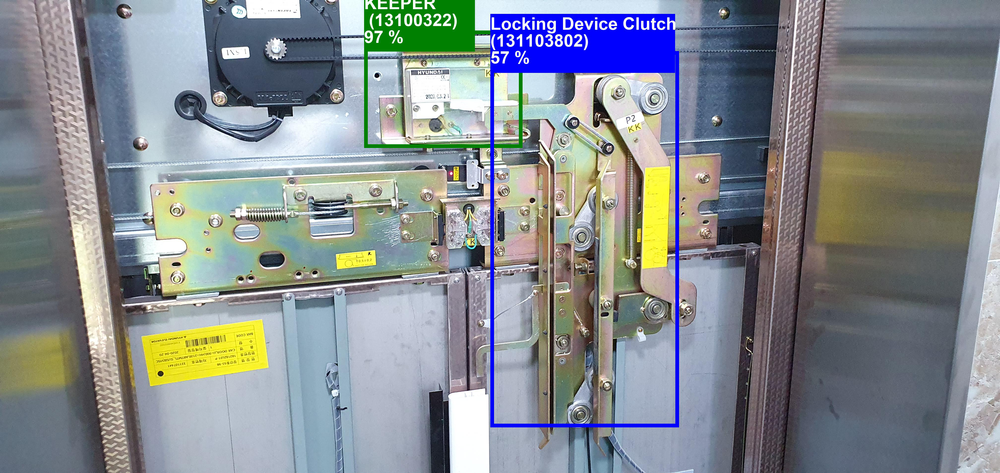

In [38]:
output_img = Image.open(os.getcwd()+'\\'+save_name+'.jpg')
output_img

In [39]:
# s3.put_object(Body=in_mem_file, Bucket=bucket, Key=save_path)